### Durga Prasad
### Ismael Rodriguez
### CIS 731
### Final Project Submission
### SCOTUS Final Pre-Processing Pipeline
### 12 DEC 2020

# I. Software Preparation

### A.  Prepare Python Packages

In [ ]:
import pandas as pd
import json

!pip install pyspark

     |████████████████████████████████| 204.2MB 67kB/s 
     |████████████████████████████████| 204kB 39.1MB/s 
  Created wheel for pyspark: filename=pyspark-3.0.1-py2.py3-none-any.whl size=204612243 sha256=9f25824ee103f6c90c67e44bfa37560fe5d960a8461a65ce8c8fbd3a1247b237
  Stored in directory: /root/.cache/pip/wheels/5e/bd/07/031766ca628adec8435bb40f0bd83bb676ce65ff4007f8e73f
Successfully built pyspark


In [ ]:
# from CIS731 HW2

import os
from pyspark import SparkContext
from pyspark.sql import SQLContext, SparkSession
sc = SparkSession.builder
sc = SparkContext.getOrCreate()
sqlContext  = SQLContext(sc)

# adapted from Oracle blog https://www.ateam-oracle.com/comparison-of-data-prep-and-cleansing-for-nlp-with-pandas-dask-and-spark

from pyspark import SparkConf
import pyspark.sql.functions as f
from pyspark.ml.feature import RegexTokenizer, StopWordsRemover
from timeit import default_timer as timer 

# adapted from https://spark.apache.org/docs/latest/ml-features#n-gram

from pyspark.ml.feature import NGram

# adapted from https://intellipaat.com/community/7658/convert-pyspark-string-to-date-format
from pyspark.sql.types import DateType

# Indexing by string value from https://www.analyticsvidhya.com/blog/2019/11/build-machine-learning-pipelines-pyspark/

from pyspark.ml.feature import StringIndexer

### Pyspark sentiment with Textblob adapted from https://medium.com/analytics-vidhya/congressional-tweets-using-sentiment-analysis-to-cluster-members-of-congress-in-pyspark-10afa4d1556e
from pyspark.sql.functions import udf, explode, split, col, length, rank, dense_rank, avg

In [ ]:
# Adapted from CIS 731 Lab 10

from pyspark import SparkContext
from pyspark.sql import SQLContext
# Create Spark Context
sc = SparkContext.getOrCreate()
sqlContext = SQLContext(sc)

# II. Data Preparation

In [ ]:
# Load dataset , Fiddler 2020 scotus dataset from https://www.kaggle.com/gqfiddler/scotus-opinions/download 
# upload all_opinions.csv to Google Colab /content/ directory

#### A.  Transform csv File into Parquet File and then into PySpark Dataframe


In [ ]:
# For follow on use with DataBricks.  Creates a parquet file from the initial Fiddler csv file
#  data transformation adapted from https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.to_parquet.html

# adapted from https://docs.databricks.com/spark/latest/spark-sql/spark-pandas.html

#pysparkSCOTUS = sqlContext.read.csv("/FileStore/tables/all_opinions.csv", header='true', multiLine='true')

dfFull = pd.read_csv('/content/all_opinions.csv') #for use with Google Colab
#dfFull = pd.read_csv('Data/all_opinions.csv') #for use with anaconda
dfFullLite = dfFull[['author_name','category','case_name','date_filed','scdb_votes_majority','scdb_votes_minority','text']]
dfFL = dfFullLite
dfFL.to_parquet('/content/allOpinions.parquet')
#parquetPandaSCOTUS = pd.read_parquet('/content/allOpinions.parquet')
parquetPandaSCOTUS.head()


,author_name,category,case_name,date_filed,scdb_votes_majority,scdb_votes_minority,text
0,Justice Roberts,majority,McCutcheon v. Federal Election Comm'n,2014-04-02,5.0,4.0,There is no right more basic in our democracy ...
1,Justice Thomas,concurring,McCutcheon v. Federal Election Comm'n,2014-04-02,5.0,4.0,I adhere to the view that this Court’s decisio...
2,Justice Breyer,dissenting,McCutcheon v. Federal Election Comm'n,2014-04-02,5.0,4.0,"Nearly 40 years ago in Buckley v. Valeo, 424 U..."
3,Justice Taney,majority,Ex Parte Crenshaw,1841-02-18,9.0,0.0,This case was brought here by an appeal from t...
4,Justice Pitney,majority,Richards v. Washington Terminal Co.,1914-05-04,8.0,1.0,"Plaintiff in error, who was plaintiff below, c..."


In [ ]:
# For use with Anaconda Notebook


# Dataset basic preprocessing in Jupyter notebook and saved as parquet file

parquetSCOTUS = sqlContext.read.parquet("/content/allOpinions.parquet", header='true')

#parquetSCOTUS = sqlContext.read.parquet("/FileStore/tables/allOpinions-1.parquet", header='true')

parquetSCOTUS.show()

pysparkSCOTUS = parquetSCOTUS

+-------------------+----------+--------------------+----------+-------------------+-------------------+--------------------+
|        author_name|  category|           case_name|date_filed|scdb_votes_majority|scdb_votes_minority|                text|
+-------------------+----------+--------------------+----------+-------------------+-------------------+--------------------+
|    Justice Roberts|  majority|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|There is no right...|
|     Justice Thomas|concurring|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|I adhere to the v...|
|     Justice Breyer|dissenting|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|Nearly 40 years a...|
|      Justice Taney|  majority|   Ex Parte Crenshaw|1841-02-18|                9.0|                0.0|This case was bro...|
|     Justice Pitney|  majority|Richards v. Washi...|1914-05-04|                8.0|                1.0|Plaintiff in e

### B.  Transform csv File with Pandas Dataframe

In [ ]:
# for use with Google Colab only if Parquet file does not load

# pandaSCOTUS = pd.read_csv('Data/all_opinions.csv')

# Drop unnecessary columns

#pandaSCOTUS = pandaSCOTUS.drop(labels='Unnamed: 0', axis=1)
#pandaSCOTUS = pandaSCOTUS.drop(labels='per_curiam', axis=1)
#pandaSCOTUS = pandaSCOTUS.drop(labels='federal_cite_one', axis=1)
#pandaSCOTUS = pandaSCOTUS.drop(labels='absolute_url', axis=1)
#pandaSCOTUS = pandaSCOTUS.drop(labels='cluster', axis=1)
#pandaSCOTUS = pandaSCOTUS.drop(labels='year_filed', axis=1)
#pandaSCOTUS = pandaSCOTUS.drop(labels='scdb_id', axis=1)
#pandaSCOTUS = pandaSCOTUS.drop(labels='scdb_decision_direction', axis=1)

#  use of timer and repartition adapted from https://www.ateam-oracle.com/comparison-of-data-prep-and-cleansing-for-nlp-with-pandas-dask-and-spark 

#toptimer = timer()
#starttime = timer()

#pysparkSCOTUS = sqlContext.createDataFrame(pandaSCOTUS)
#pysparkSCOTUS.repartition(10)

#pysparkSCOTUS.show(2)
#print('Trasform Data Frame: ', timer()-starttime)

+-------------------+----------+--------------------+----------+-------------------+-------------------+--------------------+
|        author_name|  category|           case_name|date_filed|scdb_votes_majority|scdb_votes_minority|                text|
+-------------------+----------+--------------------+----------+-------------------+-------------------+--------------------+
|    Justice Roberts|  majority|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|There is no right...|
|     Justice Thomas|concurring|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|I adhere to the v...|
|     Justice Breyer|dissenting|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|Nearly 40 years a...|
|      Justice Taney|  majority|   Ex Parte Crenshaw|1841-02-18|                9.0|                0.0|This case was bro...|
|     Justice Pitney|  majority|Richards v. Washi...|1914-05-04|                8.0|                1.0|Plaintiff in e

#### A. Prepare and Partition pySpark Dataframe

In [ ]:
#  use of timer and repartition adapted from https://www.ateam-oracle.com/comparison-of-data-prep-and-cleansing-for-nlp-with-pandas-dask-and-spark 

toptimer = timer()
starttime = timer()

#pysparkSCOTUS = sqlContext.createDataFrame(pandaSCOTUS)
pysparkSCOTUS.repartition(100)

pysparkSCOTUS.show(2)
print('Trasform Data Frame: ', timer()-starttime)

+---------------+----------+--------------------+----------+-------------------+-------------------+--------------------+
|    author_name|  category|           case_name|date_filed|scdb_votes_majority|scdb_votes_minority|                text|
+---------------+----------+--------------------+----------+-------------------+-------------------+--------------------+
|Justice Roberts|  majority|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|There is no right...|
| Justice Thomas|concurring|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|I adhere to the v...|
+---------------+----------+--------------------+----------+-------------------+-------------------+--------------------+
only showing top 2 rows

Trasform Data Frame:  1.4145372880000195


## B.  Text Pre-Processing

#### 1. Clean existing text column

In [ ]:
# adapted from Oracle blog https://www.ateam-oracle.com/comparison-of-data-prep-and-cleansing-for-nlp-with-pandas-dask-and-spark

# transform to all lower case 
toptimer = timer()
starttime = timer()

pysparkSCOTUS = pysparkSCOTUS.withColumn("cleanText", f.lower(f.col("text"))) #lowercase all text

pysparkSCOTUS.show(10)

print('Lower characters: ', timer()-starttime)




+-------------------+----------+--------------------+----------+-------------------+-------------------+--------------------+--------------------+
|        author_name|  category|           case_name|date_filed|scdb_votes_majority|scdb_votes_minority|                text|           cleanText|
+-------------------+----------+--------------------+----------+-------------------+-------------------+--------------------+--------------------+
|    Justice Roberts|  majority|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|There is no right...|there is no right...|
|     Justice Thomas|concurring|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|I adhere to the v...|i adhere to the v...|
|     Justice Breyer|dissenting|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|Nearly 40 years a...|nearly 40 years a...|
|      Justice Taney|  majority|   Ex Parte Crenshaw|1841-02-18|                9.0|                0.0|This case was 

In [ ]:
# adapted from Oracle blog https://www.ateam-oracle.com/comparison-of-data-prep-and-cleansing-for-nlp-with-pandas-dask-and-spark

# transform to all lower case, removes digits, and symbols.  
toptimer = timer()
starttime = timer()

pysparkSCOTUS = pysparkSCOTUS.withColumn("cleanText", f.regexp_replace(f.col("cleanText"), "(\\d)+", ' ')) #remove unecessary numbers and characters
pysparkSCOTUS.show(10)

print('remove numerals: ', timer()-starttime)

+-------------------+----------+--------------------+----------+-------------------+-------------------+--------------------+--------------------+
|        author_name|  category|           case_name|date_filed|scdb_votes_majority|scdb_votes_minority|                text|           cleanText|
+-------------------+----------+--------------------+----------+-------------------+-------------------+--------------------+--------------------+
|    Justice Roberts|  majority|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|There is no right...|there is no right...|
|     Justice Thomas|concurring|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|I adhere to the v...|i adhere to the v...|
|     Justice Breyer|dissenting|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|Nearly 40 years a...|nearly   years ag...|
|      Justice Taney|  majority|   Ex Parte Crenshaw|1841-02-18|                9.0|                0.0|This case was 

In [ ]:
# adapted from Oracle blog https://www.ateam-oracle.com/comparison-of-data-prep-and-cleansing-for-nlp-with-pandas-dask-and-spark

# transform to all lower case, removes digits, and symbols.  
toptimer = timer()
starttime = timer()

pysparkSCOTUS = pysparkSCOTUS.withColumn("cleanText", f.regexp_replace(f.col("cleanText"), "(\\W)+", ' ')) #remove unecessary  characters
pysparkSCOTUS.show(10)

print('remove characters: ', timer()-starttime)

+-------------------+----------+--------------------+----------+-------------------+-------------------+--------------------+--------------------+
|        author_name|  category|           case_name|date_filed|scdb_votes_majority|scdb_votes_minority|                text|           cleanText|
+-------------------+----------+--------------------+----------+-------------------+-------------------+--------------------+--------------------+
|    Justice Roberts|  majority|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|There is no right...|there is no right...|
|     Justice Thomas|concurring|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|I adhere to the v...|i adhere to the v...|
|     Justice Breyer|dissenting|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|Nearly 40 years a...|nearly years ago ...|
|      Justice Taney|  majority|   Ex Parte Crenshaw|1841-02-18|                9.0|                0.0|This case was 

#### 2. Tokenize cleaned text

In [ ]:
# adapted from https://www.ateam-oracle.com/comparison-of-data-prep-and-cleansing-for-nlp-with-pandas-dask-and-spark
starttime = timer()
regexTokenizer = RegexTokenizer(inputCol="cleanText", outputCol="cleanWords", pattern="\\W")
pysparkSCOTUStokenized = regexTokenizer.transform(pysparkSCOTUS)
pysparkSCOTUStokenized.show()

print('Tokenize Text: ', timer()-starttime)

+-------------------+----------+--------------------+----------+-------------------+-------------------+--------------------+--------------------+--------------------+
|        author_name|  category|           case_name|date_filed|scdb_votes_majority|scdb_votes_minority|                text|           cleanText|          cleanWords|
+-------------------+----------+--------------------+----------+-------------------+-------------------+--------------------+--------------------+--------------------+
|    Justice Roberts|  majority|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|There is no right...|there is no right...|[there, is, no, r...|
|     Justice Thomas|concurring|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|I adhere to the v...|i adhere to the v...|[i, adhere, to, t...|
|     Justice Breyer|dissenting|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|Nearly 40 years a...|nearly years ago ...|[nearly, years

In [ ]:
pysparkSCOTUStokenized.show()

+-------------------+----------+--------------------+----------+-------------------+-------------------+--------------------+--------------------+--------------------+
|        author_name|  category|           case_name|date_filed|scdb_votes_majority|scdb_votes_minority|                text|           cleanText|          cleanWords|
+-------------------+----------+--------------------+----------+-------------------+-------------------+--------------------+--------------------+--------------------+
|    Justice Roberts|  majority|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|There is no right...|there is no right...|[there, is, no, r...|
|     Justice Thomas|concurring|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|I adhere to the v...|i adhere to the v...|[i, adhere, to, t...|
|     Justice Breyer|dissenting|McCutcheon v. Fed...|2014-04-02|                5.0|                4.0|Nearly 40 years a...|nearly years ago ...|[nearly, years

#### 3. Remove short words and stop words

In [ ]:
# Stopword Removal

# referred to https://spark.apache.org/docs/latest/ml-features#n-gram
# adapted from Oracle blog https://www.ateam-oracle.com/comparison-of-data-prep-and-cleansing-for-nlp-with-pandas-dask-and-spark
# adapted from https://stackoverflow.com/questions/53579444/efficient-text-preprocessing-using-pyspark-clean-tokenize-stopwords-stemming

#create a word size udf
sizeUDF = udf(lambda line: [x for x in line if len(x)> 3])
starttime = timer()

stopwordWords = StopWordsRemover(inputCol = 'cleanWords', outputCol='unstoppedWords')
pysparkSCOTUSunstopped = stopwordWords.transform(pysparkSCOTUStokenized)


print('Remove Stopwords: ', timer()-starttime)

starttime = timer()
pysparkSCOTUSdistilled = pysparkSCOTUSunstopped.withColumn("distilledWords", sizeUDF(col('unstoppedWords')))
#pysparkSCOTUSdistilled.select('distilledWords', 'unstoppedWords').show(10)
print('Remove Short Words: ', timer()-starttime)





Remove Stopwords:  0.24833028400007606
Remove Short Words:  0.04342167000004338


In [ ]:
! pip install nltk

In [ ]:
# calculate baseline for pandas adapted from MIS 670 Pandas for Text Analytics Homework, submitted 19 FEB 2020
import nltk
from nltk.corpus import stopwords, WordListCorpusReader
nltk.download('stopwords') #from error message suggestion

#adapted from https://www.nltk.org/book/ch02.html
stopwords = nltk.corpus.stopwords.words('english')
 

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


#### 4. Create Bigrams

In [ ]:
# adapted from https://spark.apache.org/docs/latest/ml-features#n-gram

starttime = timer()

bigramWords = NGram(n=2, inputCol = 'unstoppedWords', outputCol='bigrams')
pysparkSCOTUSbigrams = bigramWords.transform(pysparkSCOTUSdistilled)

pysparkSCOTUSbigrams.select('bigrams').show()

print('Discover Bigrams: ', timer()-starttime)

+--------------------+
|             bigrams|
+--------------------+
|[right basic, bas...|
|[adhere view, vie...|
|[nearly years, ye...|
|[case brought, br...|
|[plaintiff error,...|
|[whether state, s...|
|[judgment affirme...|
|[writ error, erro...|
|[october opened, ...|
|[case presents, p...|
|[petitioner sough...|
|[petitioner born,...|
|[action upon, upo...|
|[admonished consi...|
|[hold valid, vali...|
|[dissent opinion,...|
|[federal statute,...|
|[individual facin...|
|[wisconsin gas, g...|
|[question present...|
+--------------------+
only showing top 20 rows

Discover Bigrams:  1.567299637999895


#### 5. Count words in clean text

In [ ]:
# Word Count adapted from https://stackoverflow.com/questions/48927271/count-number-of-words-in-a-spark-dataframe/48930628


starttime = timer()

pysparkSCOTUSwordcount = pysparkSCOTUSbigrams.withColumn("wordCount", f.size('cleanWords'))

pysparkSCOTUSwordcount.select('wordCount').show()
print('Remove Stopwords: ', timer()-starttime)

+---------+
|wordCount|
+---------+
|    12028|
|     1444|
|     9098|
|      410|
|     3365|
|     4672|
|       15|
|     2241|
|     1575|
|      845|
|      295|
|     1153|
|     1658|
|     2928|
|     1176|
|       26|
|     6868|
|     5759|
|     1594|
|     2397|
+---------+
only showing top 20 rows

Remove Stopwords:  1.0340481230000478


#### Change date_filed to Date type

In [ ]:
# adapted from https://intellipaat.com/community/7658/convert-pyspark-string-to-date-format
# adapted from https://spark.apache.org/docs/latest/api/python/pyspark.sql.html

from pyspark.sql.types import DateType

starttime = timer()
pysparkSCOTUSwordcount = pysparkSCOTUSwordcount.withColumn("dateFiled", pysparkSCOTUSwordcount['date_filed'].cast(DateType()))

print('Transfrom Date: ', timer()-starttime)

Transfrom Date:  0.030456060999995316


#### Transform categories into categorical values

In [ ]:
# Indexing by string value from https://www.analyticsvidhya.com/blog/2019/11/build-machine-learning-pipelines-pyspark/

#category index

from pyspark.ml.feature import StringIndexer

starttime = timer()

stringCategory = StringIndexer(inputCol = 'category', outputCol = 'categoryIndex')
pysparkSCOTUSfinal = stringCategory.fit(pysparkSCOTUSwordcount).transform(pysparkSCOTUSwordcount)
pysparkSCOTUSfinal.select('author_name','category','categoryIndex').show(10)

print('Transform Categories: ', timer()-starttime)

+-------------------+----------+-------------+
|        author_name|  category|categoryIndex|
+-------------------+----------+-------------+
|    Justice Roberts|  majority|          0.0|
|     Justice Thomas|concurring|          3.0|
|     Justice Breyer|dissenting|          1.0|
|      Justice Taney|  majority|          0.0|
|     Justice Pitney|  majority|          0.0|
|     Justice Harlan|  majority|          0.0|
|         per_curiam|per_curiam|          2.0|
|     Justice Miller|  majority|          0.0|
|Justice Frankfurter|  majority|          0.0|
|     Justice Swayne|  majority|          0.0|
+-------------------+----------+-------------+
only showing top 10 rows

Transform Categories:  2.1781375460000163


## C.  Analytics Pre-Preprocessing

#### 1.  TFIDF Calculations with MLLib

In [ ]:
# Adapted from https://towardsdatascience.com/sentiment-analysis-with-pyspark-bc8e83f80c35
# adapted from IDF: https://spark.apache.org/docs/latest/ml-features.html

from pyspark.ml.feature import HashingTF, IDF

starttime=timer()
tfScore = HashingTF(numFeatures=2**16, inputCol='unstoppedWords', outputCol='TF')
pysparkSCOTUShashed = tfScore.transform(pysparkSCOTUSdistilled)
idf = IDF(inputCol='TF', outputCol='IDF')
idfScore = idf.fit(pysparkSCOTUShashed)
pysparkSCOTUStfidf = idfScore.transform(pysparkSCOTUShashed)

pysparkSCOTUStfidf.select("cleanText","unstoppedWords","TF","IDF").show()

print('Calculate TFIDF: ', timer()-starttime)

+--------------------+--------------------+--------------------+--------------------+
|           cleanText|      unstoppedWords|                  TF|                 IDF|
+--------------------+--------------------+--------------------+--------------------+
|there is no right...|[right, basic, de...|(65536,[10,88,90,...|(65536,[10,88,90,...|
|i adhere to the v...|[adhere, view, co...|(65536,[92,154,31...|(65536,[92,154,31...|
|nearly years ago ...|[nearly, years, a...|(65536,[65,88,120...|(65536,[65,88,120...|
|this case was bro...|[case, brought, a...|(65536,[12,737,13...|(65536,[12,737,13...|
|plaintiff in erro...|[plaintiff, error...|(65536,[124,209,2...|(65536,[124,209,2...|
|whether the state...|[whether, state, ...|(65536,[7,12,19,3...|(65536,[7,12,19,3...|
|the judgment is a...|[judgment, affirm...|(65536,[17303,173...|(65536,[17303,173...|
|this is a writ of...|[writ, error, cir...|(65536,[12,154,37...|(65536,[12,154,37...|
|october opened an...|[october, opened,...|(65536,[10,

#### 2.  Sentiment Analysis Scoring with Textblob

In [ ]:
!pip install TextBlob

In [ ]:
# Pyspark sentiment with Textblob adapted from https://medium.com/analytics-vidhya/congressional-tweets-using-sentiment-analysis-to-cluster-members-of-congress-in-pyspark-10afa4d1556e
#adapted from https://towardsdatascience.com/having-fun-with-textblob-7e9eed783d3f
# adapted from https://www.analyticsvidhya.com/blog/2018/02/natural-language-processing-for-beginners-using-textblob/

from textblob import TextBlob

# Create UDFs

sentimentTextblob = udf(lambda x: TextBlob(x).sentiment)
sentimentPolarity = udf(lambda x: TextBlob(x).sentiment[0])
sentimentSubjectivity = udf(lambda x: TextBlob(x).sentiment[1])
#spark.udf.register("textblobSubjectivity", sentimentSubjectivity)

In [ ]:
starttime = timer()

#pysparkSCOTUStextblob = pysparkSCOTUSfinal.withColumn('textblobSentiment', sentimentTextblob(col('cleanText')))
pysparkSCOTUSpolarity = pysparkSCOTUSfinal.withColumn('textblobPolarity', sentimentPolarity(col('cleanText')))
pysparkSCOTUSsubjectivity = pysparkSCOTUSpolarity.withColumn('textblobSubjectivity', sentimentSubjectivity(col('cleanText')))
#pysparkSCOTUStextblob.select('textblobSentiment').show(10)
pysparkSCOTUSsubjectivity.select('textblobPolarity','textblobSubjectivity').show()

print('Calculate Sentiment: ', timer()-starttime)

+--------------------+--------------------+
|    textblobPolarity|textblobSubjectivity|
+--------------------+--------------------+
|0.022052852146276922|  0.4573129866034311|
| 0.08493792236366492| 0.40575161087537326|
| 0.07242707858661816|  0.4214571941216673|
|0.001875000000000...|   0.178661858974359|
| 0.04147974362015457| 0.40380801656486587|
| 0.07311520582738291|  0.4324083358216198|
|                 0.0|                 0.0|
| 0.04094568892645814|  0.3629996125669204|
| 0.07015501091828524| 0.37603659860297023|
| 0.04215221715221716|  0.3895957645957645|
| 0.01796536796536797|  0.5185064935064935|
| 0.11488860466133193|  0.4481476015566925|
|0.032855976795370744| 0.44243371667614106|
|-0.00875367192331...|  0.3872610028860029|
| 0.12348484848484846|  0.4387987012987014|
|-0.05555555555555555| 0.15277777777777776|
| 0.10037861556916447|  0.5331649318387124|
| 0.13035241894364294|  0.5435850158309745|
|0.019342231842231848|  0.3029521404521404|
|-0.04573664693149987|  0.420477

In [ ]:
# adapted from https://stackoverflow.com/questions/40478018/pyspark-dataframe-convert-multiple-columns-to-float/51842141
from pyspark.sql.functions import col

pysparkSCOTUSsubjectivity = pysparkSCOTUSsubjectivity.withColumn('polarityScore', col("textblobPolarity").cast('float'))
pysparkSCOTUSsubjectivity = pysparkSCOTUSsubjectivity.withColumn('subjectivityScore', col("textblobSubjectivity").cast('float'))

In [ ]:
pysparkSCOTUSml = pysparkSCOTUSsubjectivity

In [ ]:
pysparkSCOTUSml.select('author_name','textblobPolarity','textblobSubjectivity','cleanText','dateFiled').show()

+-------------------+--------------------+--------------------+--------------------+----------+
|        author_name|    textblobPolarity|textblobSubjectivity|           cleanText| dateFiled|
+-------------------+--------------------+--------------------+--------------------+----------+
|    Justice Roberts|0.022052852146276922|  0.4573129866034311|there is no right...|2014-04-02|
|     Justice Thomas| 0.08493792236366492| 0.40575161087537326|i adhere to the v...|2014-04-02|
|     Justice Breyer| 0.07242707858661816|  0.4214571941216673|nearly years ago ...|2014-04-02|
|      Justice Taney|0.001875000000000...|   0.178661858974359|this case was bro...|1841-02-18|
|     Justice Pitney| 0.04147974362015457| 0.40380801656486587|plaintiff in erro...|1914-05-04|
|     Justice Harlan| 0.07311520582738291|  0.4324083358216198|whether the state...|1882-04-24|
|         per_curiam|                 0.0|                 0.0|the judgment is a...|1965-10-18|
|     Justice Miller| 0.0409456889264581

## D.  Prepare Data for Export

#### Save pyspark to Parquet

In [ ]:
# Time consuming.  Use only if necessary
# adapted from https://spark.apache.org/docs/latest/sql-data-sources-parquet.html
#### Save pyspark to Parquet

# starttime =timer()

#pysparkSCOTUSml.write.parquet('/content/scotusOpinionsAnalytics.parquet')

#print("Create scotusopinions.parquet: ", timer()-starttime)



Save pySpark to csv for Tableau

In [ ]:
# Create a PySpark Dataframe without text elements

scotusSELECT = pysparkSCOTUSml.select('author_name','category','categoryIndex','case_name', 'date_filed','scdb_votes_majority','scdb_votes_minority','wordCount','polarityScore','subjectivityScore')

In [ ]:
selectSCOTUS = scotusSELECT.toPandas() 

KeyboardInterrupt: ignored

In [ ]:
# As required, creates csv file for use with Tableau

#starttime =timer()

#selectSCOTUS.to_csv('/content/12-11-2020-scotusTableauLite.csv')
  
#print("Create scotusTableauLite: ", timer()-starttime)

In [ ]:
liteSCOTUS = scotusSELECT

In [ ]:
liteSCOTUS.head()

# III.  Exploratory Analysis of Results

### A.  Visualization of Results

In [ ]:
# For use with Databricks

# visualSCOTUS = sqlContext.read.parquet("/FileStore/scotusOpinionsAnalytics.parquet", header='true')
# visualSCOTUS = sqlContext.read.parquet("/FileStore/scotusOpinionsAnalytics.parquet", header='true')
#visualSCOTUS.show()

+-------------------+----------+--------------------+----------+-------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+---------+----------+-------------+--------------------+--------------------+-------------+-----------------+
 author_name| category| case_name|date_filed|scdb_votes_majority| text| cleanText| cleanWords| unstoppedWords| distilledWords| bigrams|wordCount| dateFiled|categoryIndex| textblobPolarity|textblobSubjectivity|polarityScore|subjectivityScore|
+-------------------+----------+--------------------+----------+-------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+---------+----------+-------------+--------------------+--------------------+-------------+-----------------+
 Justice Roberts| majority|McCutcheon v. Fed...|2014-04-02| 5.0|There is no right...|there is no right...|[there, is, no, r...|[right, basic, de...|[right, basic, de...|[right basic, bas...| 12028|2014-04-02| 0.0|0.022052852146276922| 0.4573129866034311| 0.022052852| 0.457313|
 Justice Thomas|concurring|McCutcheon v. Fed...|2014-04-02| 5.0|I adhere to the v...|i adhere to the v...|[i, adhere, to, t...|[adhere, view, co...|[adhere, view, co...|[adhere view, vie...| 1444|2014-04-02| 3.0| 0.08493792236366492| 0.40575161087537326| 0.08493792| 0.40575162|
 Justice Breyer|dissenting|McCutcheon v. Fed...|2014-04-02| 5.0|Nearly 40 years a...|nearly years ago ...|[nearly, years, a...|[nearly, years, a...|[nearly, years, b...|[nearly years, ye...| 9098|2014-04-02| 1.0| 0.07242707858661816| 0.4214571941216673| 0.07242708| 0.4214572|
 Justice Taney| majority| Ex Parte Crenshaw|1841-02-18| 9.0|This case was bro...|this case was bro...|[this, case, was,...|[case, brought, a...|[case, brought, a...|[case brought, br...| 410|1841-02-18| 0.0|0.001875000000000...| 0.178661858974359| 0.001875| 0.17866185|
 Justice Pitney| majority|Richards v. Washi...|1914-05-04| 8.0|Plaintiff in erro...|plaintiff in erro...|[plaintiff, in, e...|[plaintiff, error...|[plaintiff, error...|[plaintiff error,...| 3365|1914-05-04| 0.0| 0.04147974362015457| 0.40380801656486587| 0.041479744| 0.40380803|
 Justice Harlan| majority|Hammock v. Loan &...|1882-04-24| 7.0|Whether the State...|whether the state...|[whether, the, st...|[whether, state, ...|[whether, state, ...|[whether state, s...| 4672|1882-04-24| 0.0| 0.07311520582738291| 0.4324083358216198| 0.07311521| 0.43240833|
 per_curiam|per_curiam| Wells v. Reynolds|1965-10-18| null|The judgment is a...|the judgment is a...|[the, judgment, i...|[judgment, affirm...|[judgment, affirm...|[judgment affirme...| 15|1965-10-18| 2.0| 0.0| 0.0| 0.0| 0.0|
 Justice Miller| majority| Hill v. Sumner|1889-11-11| 8.0|This is a writ of...|this is a writ of...|[this, is, a, wri...|[writ, error, cir...|[writ, error, cir...|[writ error, erro...| 2241|1889-11-11| 0.0| 0.04094568892645814| 0.3629996125669204| 0.04094569| 0.36299962|
Justice Frankfurter| majority|Palmer v. Massach...|1939-11-06| 8.0|October 23, 1935,...|october opened an...|[october, opened,...|[october, opened,...|[october, opened,...|[october opened, ...| 1575|1939-11-06| 0.0| 0.07015501091828524| 0.37603659860297023| 0.07015501| 0.37603658|
 Justice Swayne| majority|Otis v. Cullum, R...|1876-01-24| 9.0|This case present...|this case present...|[this, case, pres...|[case, presents, ...|[case, presents, ...|[case presents, p...| 845|1876-01-24| 0.0| 0.04215221715221716| 0.3895957645957645| 0.04215222| 0.38959578|
 per_curiam|per_curiam|Niukkanen v. McAl...|1960-06-06| 5.0|The petitioner so...|the petitioner so...|[the, petitioner,...|[petitioner, soug...|[petitioner, soug...|[petitioner sough...| 295|1960-06-06| 2.0| 0.01796536796536797| 0.5185064935064935| 0.017965367| 0.51850647|
 Justice Douglas|dissenting|Niukkanen v. McAl...|1960-06-06| 5.0|Petitioner was bo...|petitioner was bo...|[petitioner, was,...|

In [ ]:
#visualSELECT = pysparkSCOTUSml.select('author_name','category','categoryIndex','case_name', 'date_filed','scdb_votes_majority','scdb_votes_minority','wordCount','polarityScore','subjectivityScore')

In [ ]:
#visualSELECT.show()

+-------------------+----------+-------------+--------------------+----------+-------------------+---------+-------------+-----------------+
 author_name| category|categoryIndex| case_name|date_filed|scdb_votes_majority|wordCount|polarityScore|subjectivityScore|
+-------------------+----------+-------------+--------------------+----------+-------------------+---------+-------------+-----------------+
 Justice Roberts| majority| 0.0|McCutcheon v. Fed...|2014-04-02| 5.0| 12028| 0.022052852| 0.457313|
 Justice Thomas|concurring| 3.0|McCutcheon v. Fed...|2014-04-02| 5.0| 1444| 0.08493792| 0.40575162|
 Justice Breyer|dissenting| 1.0|McCutcheon v. Fed...|2014-04-02| 5.0| 9098| 0.07242708| 0.4214572|
 Justice Taney| majority| 0.0| Ex Parte Crenshaw|1841-02-18| 9.0| 410| 0.001875| 0.17866185|
 Justice Pitney| majority| 0.0|Richards v. Washi...|1914-05-04| 8.0| 3365| 0.041479744| 0.40380803|
 Justice Harlan| majority| 0.0|Hammock v. Loan &...|1882-04-24| 7.0| 4672| 0.07311521| 0.43240833|
 per_curiam|per_curiam| 2.0| Wells v. Reynolds|1965-10-18| null| 15| 0.0| 0.0|
 Justice Miller| majority| 0.0| Hill v. Sumner|1889-11-11| 8.0| 2241| 0.04094569| 0.36299962|
Justice Frankfurter| majority| 0.0|Palmer v. Massach...|1939-11-06| 8.0| 1575| 0.07015501| 0.37603658|
 Justice Swayne| majority| 0.0|Otis v. Cullum, R...|1876-01-24| 9.0| 845| 0.04215222| 0.38959578|
 per_curiam|per_curiam| 2.0|Niukkanen v. McAl...|1960-06-06| 5.0| 295| 0.017965367| 0.51850647|
 Justice Douglas|dissenting| 1.0|Niukkanen v. McAl...|1960-06-06| 5.0| 1153| 0.1148886| 0.4481476|
 Justice Holmes| majority| 0.0| Fauntleroy v. Lum|1908-05-18| 5.0| 1658| 0.032855976| 0.4424337|
 Justice White|dissenting| 1.0| Fauntleroy v. Lum|1908-05-18| 5.0| 2928| -0.008753672| 0.387261|
 Justice Hunt| majority| 0.0|County of Bates v...|1878-02-25| 6.0| 1176| 0.12348485| 0.4387987|
 Justice Clifford|dissenting| 1.0|County of Bates v...|1878-02-25| 6.0| 26| -0.055555556| 0.15277778|
 Justice Kagan| majority| 0.0|Kaley v. United S...|2014-02-25| null| 6868| 0.10037862| 0.5331649|
 Justice Roberts|dissenting| 1.0|Kaley v. United S...|2014-02-25| null| 5759| 0.13035242| 0.543585|
 Justice Rutledge| majority| 0.0|Wisconsin Gas Co....|1944-06-05| 8.0| 1594| 0.019342232| 0.30295214|
 Justice Mckenna| majority| 0.0|Williams v. Missi...|1898-04-25| 9.0| 2397| -0.04573665| 0.4204772|
+-------------------+----------+-------------+--------------------+----------+-------------------+---------+-------------+-----------------+
only showing top 20 rows

In [ ]:
#liteSCOTUS = visualSELECT.toPandas()

### A.  Visualization of Results

In [ ]:
# Import Software Packages
# From MIS665 Plotly Full Version Tutorial and MIS665 Data Visualization Overview Tutorial

import plotly
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np

import warnings
warnings.filterwarnings("ignore")

In [ ]:
liteSCOTUS.head()

Out[9]:

,author_name,category,categoryIndex,case_name,date_filed,scdb_votes_majority,wordCount,polarityScore,subjectivityScore
0,Justice Roberts,majority,0.0,McCutcheon v. Federal Election Comm'n,2014-04-02,5.0,12028,0.022053,0.457313
1,Justice Thomas,concurring,3.0,McCutcheon v. Federal Election Comm'n,2014-04-02,5.0,1444,0.084938,0.405752
2,Justice Breyer,dissenting,1.0,McCutcheon v. Federal Election Comm'n,2014-04-02,5.0,9098,0.072427,0.421457
3,Justice Taney,majority,0.0,Ex Parte Crenshaw,1841-02-18,9.0,410,0.001875,0.178662
4,Justice Pitney,majority,0.0,Richards v. Washington Terminal Co.,1914-05-04,8.0,3365,0.041480,0.403808


In [ ]:
liteSCOTUS.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35781 entries, 0 to 35780
Data columns (total 9 columns):
 # Column Non-Null Count Dtype 
--- ------ -------------- ----- 
 0 author_name 35781 non-null object 
 1 category 35781 non-null object 
 2 categoryIndex 35781 non-null float64
 3 case_name 35781 non-null object 
 4 date_filed 35781 non-null object 
 5 scdb_votes_majority 34018 non-null float64
 6 wordCount 35781 non-null int32 
 7 polarityScore 35781 non-null float32
 8 subjectivityScore 35781 non-null float32
dtypes: float32(2), float64(2), int32(1), object(4)
memory usage: 2.0+ MB

Out[41]:

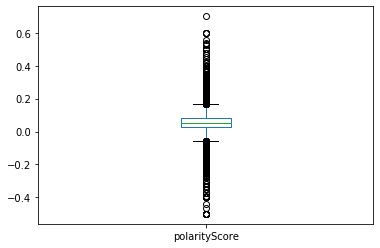

<matplotlib.axes._subplots.AxesSubplot at 0x7ff6b6c61450>

In [ ]:
# adapted from MIS665 Data Visualization Overview Tutorial

liteSCOTUS['polarityScore'].plot.box()

Out[42]:

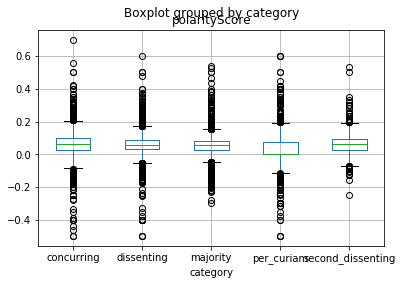

<matplotlib.axes._subplots.AxesSubplot at 0x7ff6b6c19250>

In [ ]:
# adapted from MIS665 Data Visualization Overview Tutorial
liteSCOTUS.boxplot(column='polarityScore', by='category')

In [ ]:
liteSCOTUS.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35781 entries, 0 to 35780
Data columns (total 9 columns):
 # Column Non-Null Count Dtype 
--- ------ -------------- ----- 
 0 author_name 35781 non-null object 
 1 category 35781 non-null object 
 2 categoryIndex 35781 non-null float64
 3 case_name 35781 non-null object 
 4 date_filed 35781 non-null object 
 5 scdb_votes_majority 34018 non-null float64
 6 wordCount 35781 non-null int32 
 7 polarityScore 35781 non-null float32
 8 subjectivityScore 35781 non-null float32
dtypes: float32(2), float64(2), int32(1), object(4)
memory usage: 2.0+ MB

In [ ]:
# adapted from https://stackoverflow.com/questions/30405413/python-pandas-extract-year-from-datetime-dfyear-dfdate-year-is-not

liteSCOTUS['date'] = pd.to_datetime(liteSCOTUS['date_filed'])
liteSCOTUS['year'] = liteSCOTUS['date'].dt.year

In [ ]:
# adapted from MIS 665 lab 2 and https://stackoverflow.com/questions/59690099/convert-datetime64ns-column-to-datetimeindex-in-pandas

liteSCOTUS.set_index('year').index.astype('datetime64[ns]')

Out[258]: DatetimeIndex(['1970-01-01 00:00:00.000002014',
 '1970-01-01 00:00:00.000002014',
 '1970-01-01 00:00:00.000002014',
 '1970-01-01 00:00:00.000001841',
 '1970-01-01 00:00:00.000001914',
 '1970-01-01 00:00:00.000001882',
 '1970-01-01 00:00:00.000001965',
 '1970-01-01 00:00:00.000001889',
 '1970-01-01 00:00:00.000001939',
 '1970-01-01 00:00:00.000001876',
 ...
 '1970-01-01 00:00:00.000001889',
 '1970-01-01 00:00:00.000001882',
 '1970-01-01 00:00:00.000001911',
 '1970-01-01 00:00:00.000001947',
 '1970-01-01 00:00:00.000001877',
 '1970-01-01 00:00:00.000001987',
 '1970-01-01 00:00:00.000001974',
 '1970-01-01 00:00:00.000001974',
 '1970-01-01 00:00:00.000001974',
 '1970-01-01 00:00:00.000001974'],
 dtype='datetime64[ns]', name='year', length=35781, freq=None)

Out[135]:

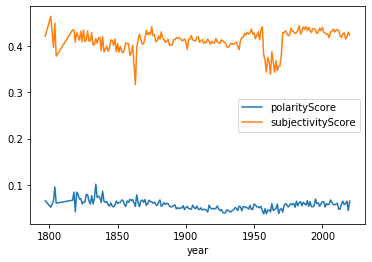

<matplotlib.axes._subplots.AxesSubplot at 0x7ff6adca1590>

In [ ]:
#adapted from https://stackoverflow.com/questions/13890673/pandas-generate-and-plot-average

yearSCOTUS.groupby('year').mean().plot()

Out[136]:

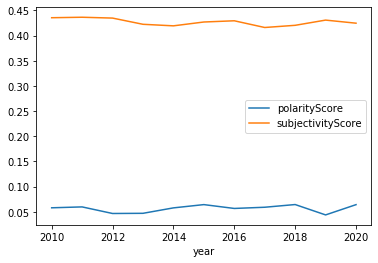

<matplotlib.axes._subplots.AxesSubplot at 0x7ff6adcfe150>

In [ ]:
l201xSCOTUS.groupby('year').mean().plot()

In [ ]:
# adapted from plotly.com/python/pandas-backend/


pd.options.plotting.backend = 'plotly'
liteSCOTUS2 = liteSCOTUS[['year','polarityScore','subjectivityScore']]
liteSCOTUS2.groupby('year').mean().plot()

Out[260]:

Out[137]:

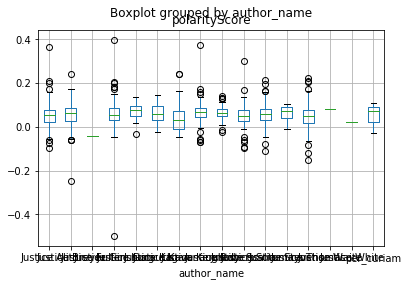

<matplotlib.axes._subplots.AxesSubplot at 0x7ff6adc87590>

In [ ]:
# adapted from MIS665 Data Visualization Overview Tutorial and MIS665 lab 2

plt.figure(figsize=[10,6])
l201xSCOTUS.boxplot(column='polarityScore', by='author_name')

In [ ]:
#### box plot comparison


Out[265]:

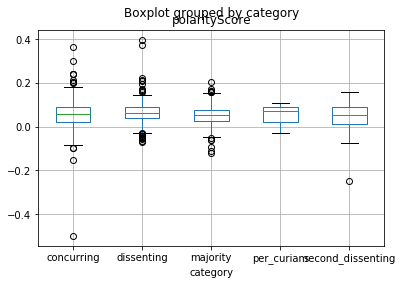

<matplotlib.axes._subplots.AxesSubplot at 0x7ff6a9dbcf10>

In [ ]:
# python matplotlib
# adapted from MIS665 Data Visualization Overview Tutorial and MIS665 lab 2
# adapted from plotly.com/python/pandas-backend/

pd.options.plotting.backend = 'matplotlib'

plt.figure(figsize=[40,20])
l201xSCOTUS.boxplot(column='polarityScore', by='category')

In [ ]:
# plotly box plot
# adapted from MIS 665 Plotly Express Homework

px.box(liteSCOTUS, x = "author_name" , y = "polarityScore" , color="category", hover_name ="case_name")

Out[247]:

In [ ]:
px.box(liteSCOTUS, x = "category" , y = "polarityScore" , color="category", hover_name ="case_name")

Out[261]:

Out[252]:

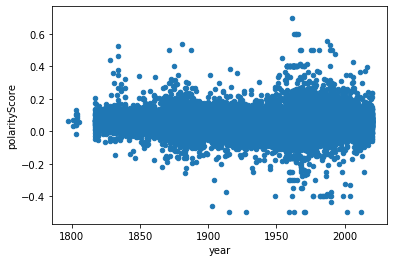

<matplotlib.axes._subplots.AxesSubplot at 0x7ff6aaeb7f10>

In [ ]:
# Python matplotlib scatter plot

#adapted from MIS 665 Data Visualization Overview Tutorial
pd.options.plotting.backend = 'matplotlib'
liteSCOTUS.plot.scatter('year','polarityScore')

In [ ]:
# plotly scatter plot

In [ ]:
# Adapted from MIS665 midterm Project
# addtition of lowess line from plotly.com/python-api-reference/generated/plotly.express.scatter.html

x= liteSCOTUS['date']
y =liteSCOTUS['polarityScore']

px.scatter(liteSCOTUS, x=x,y=y, trendline='lowess', hover_name = 'case_name', color='category',  size="wordCount")
#px.scatter(liteSCOTUS, x="polarityScore", y="subjectivityScore", hover_name="case_name", color='category', size="wordCount")

Out[250]:

## IV.  Machine Learning